In [1]:
import warnings
warnings.filterwarnings('ignore')

import scanpy as scp
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import scrublet as scr
import os
import mnnpy

import sys
sys.path.append('../../')
from pipelines import *

from parameters import *

%matplotlib inline

The history saving thread hit an unexpected error (DatabaseError('database disk image is malformed')).History will not be written to the database.


In [2]:
import os
os.environ["HDF5_USE_FILE_LOCKING"] = "FALSE"
adata = scp.read("/lustre/projects/Stembryo_Seq/Meissner_gabriel/raw.h5ad") #loads post-convo r-object data

#Load to the working matrix the raw counts
adata.X = adata.obsm["Raw"].copy()

In [3]:
#addmetadata
meta = pd.read_csv('/lustre/projects/Stembryo_Seq/emb_meta_meissner2.csv')
adata.obs['BC']=meta['Unnamed: 0'].values
adata.obs['Stage']=meta['stage'].values
adata.obs['Cluster']=meta['cluster'].values
adata.obs['Sample']=meta['sample'].values
adata.obs['Sample_numeric']=adata.obs['Sample'].str[3:]
adata.obs.head()

,BC,Stage,Cluster,Sample
0,WT65;SG4_AAACCTGAGGTGTGGT-1,WT_65,17.0,47
1,WT65;SG4_AAACCTGCACCAGGCT-1,WT_65,17.0,28
2,WT65;SG4_AAACCTGGTAAGGATT-1,WT_65,4.0,1
3,WT65;SG4_AAACCTGGTACAGACG-1,WT_65,17.0,1
4,WT65;SG4_AAACCTGGTGTTCGAT-1,WT_65,4.0,16


# Basic QC measures

The quality control is based on the following metrics:

1. Total count of reads per cell
2. Total count of non-zero genes per cell
3. Mitochondrial fraction

The dataset as already provided by the authors has removed the tails of the total counts. The only group of cells that have not been removed are stripped cells, as detected by the bimodality at very low mitochondrial fractions. We set a threshold for imputing these cells as stripped cells.

In [4]:
mtGenesPositions = np.array([i for i,j in enumerate(adata.var["Gene"]) if "mt-" in j])

In [5]:
quality_control_metrics(adata,mtGenesPositions)

## UMI counts per cell

The UMI counts had already a high lower cutoff. We do not increase the constrain as it seems to fall in the basin of the bimodality between the removed lower UMI count (<5000) and the proper count distribution.

We do not set any upper bound, in the same way of their analysis. If high count cells are doublets, very probably they will be detected in by the doublet deconvolution procedure we will perform afterwards.

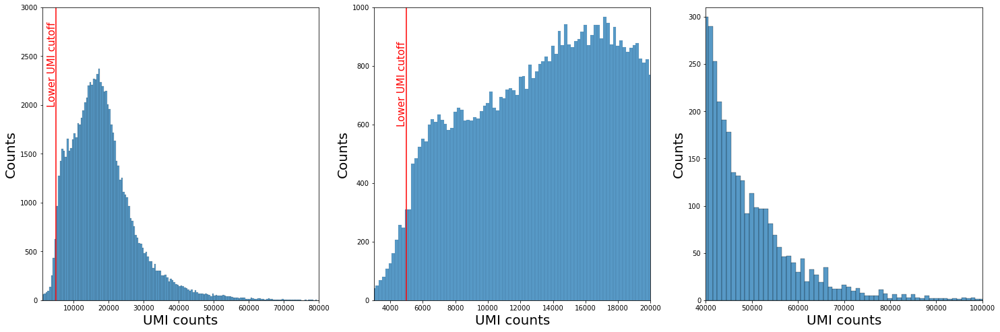

In [9]:
fig,ax = plt.subplots(1,3,figsize=[25,8])

##Counts
i0 = 0; i1 = None;
sns.histplot(data=adata.obs,x="#Counts",ax=ax[i0],binwidth=500);
ax[i0].axis([1000,80000,0,3000])
ax[i0].vlines(MIN_COUNTS,0,5000,color="r")
ax[i0].text(MIN_COUNTS-2600,2000,"Lower UMI cutoff",color="red",fontsize=15,rotation="vertical")
#ax[i0,i1].vlines(maxCounts,0,5000,color="r")
#ax[i0,i1].text(maxCounts+600,3500,"Upper UMI cutoff",color="red",fontsize=15,rotation="vertical")
ax[i0].set_xlabel("UMI counts",fontsize=20)
ax[i0].set_ylabel("Counts",fontsize=20)

i0 = 1; i1 = 1;
sns.histplot(data=adata.obs,x="#Counts",ax=ax[i0],binwidth=200);
ax[i0].axis([3000,20000,0,1000])
ax[i0].vlines(MIN_COUNTS,0,5000,color="r")
ax[i0].text(MIN_COUNTS-600,600,"Lower UMI cutoff",color="red",fontsize=15,rotation="vertical")
#ax[i0,i1].vlines(maxCounts,0,5000,color="r")
#ax[i0,i1].text(maxCounts+600,3500,"Upper UMI cutoff",color="red",fontsize=15,rotation="vertical")
ax[i0].set_xlabel("UMI counts",fontsize=20)
ax[i0].set_ylabel("Counts",fontsize=20)

i0 = 2; i1 = 2;
sns.histplot(data=adata.obs,x="#Counts",ax=ax[i0],binwidth=1000);
ax[i0].axis([40000,100000,0,310])
#ax[i0,i1].vlines(mi#Counts,0,5000,color="r")
#ax[i0,i1].text(mi#Counts-600,1500,"Lower UMI cutoff",color="red",fontsize=15,rotation="vertical")
ax[i0].vlines(MAX_COUNTS,0,5000,color="r")
#ax[i0,i1].text(maxCounts+600,3500,"Upper UMI cutoff",color="red",fontsize=15,rotation="vertical")
ax[i0].set_xlabel("UMI counts",fontsize=20)
ax[i0].set_ylabel("Counts",fontsize=20)

fig.savefig("Plots/1_QC_UMI_counts.png",bbox_inches="tight",transparent=True)
fig.show()

## Gene counts per cell

The number of gene counts show a clear bimodality. This is perfectly normal since the dataset has a very extense variety of cell types with different genetic patterns. We do not constraint at all the distribution at all, as in the analysis of Pijuan and set very loose bounds.


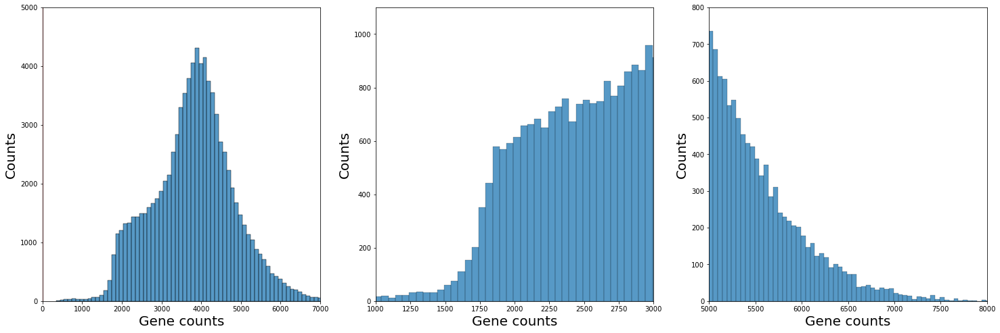

In [11]:
fig,ax = plt.subplots(1,3,figsize=[25,8])

##Genes
i0 = 0; i1 = 0;
sns.histplot(data=adata.obs,x="#Genes",ax=ax[i0],binwidth=100);
ax[i0].axis([0,7000,0,5000])
ax[i0].vlines(MIN_GENES,0,10000,color="r")
#ax[i0].text(MIN_GENES-300,1500,"Lower #Genes cutoff",color="red",fontsize=15,rotation="vertical")
ax[i0].set_xlabel("Gene counts",fontsize=20)
ax[i0].set_ylabel("Counts",fontsize=20)

i0 = 1; i1 = 1;
sns.histplot(data=adata.obs,x="#Genes",ax=ax[i0],binwidth=50);
ax[i0].axis([1000,3000,0,1100])
ax[i0].vlines(MIN_GENES,0,4000,color="r")
#ax[i0].text(MIN_GENES-100,1500,"Lower #Genes cutoff",color="red",fontsize=15,rotation="vertical")
ax[i0].set_xlabel("Gene counts",fontsize=20)
ax[i0].set_ylabel("Counts",fontsize=20)

i0 = 2; i1 = 2;
sns.histplot(data=adata.obs,x="#Genes",ax=ax[i0],binwidth=50);
ax[i0].axis([5000,8000,0,800])
ax[i0].vlines(MAX_GENES,0,5000,color="r")
#ax[i0].text(MAX_GENES+100,100,"Higher #Genes cutoff",color="red",fontsize=15,rotation="vertical")
ax[i0].set_xlabel("Gene counts",fontsize=20)
ax[i0].set_ylabel("Counts",fontsize=20)

fig.savefig("Plots/1_QC_Gene_counts.png",bbox_inches="tight",transparent=True)
fig.show()

## Mitochondrial fraction

The dataset has already a predefined upper bound, which will represent dead or dying cells. According to Pijuan's article, after a extremely convoluted process involving clustering the data in a very sloppy way they concluded that they should also remove all cells with a mitochondrial fraction below 0.005.

I consider this process to be very weird and suspicious and simply chose a lower bound according to the bidomal distribution of the mt fraction. This subset if considered to be due to stripped cells, which exploded and only genes from the nuclei are present mostly. 

Although it is clear that there is a subset of cells that show a extremelly low expression of mitochondrial genes, which will be an indicator of stripped cells, in the original work, this fraction is never removed from the system. The threshold chosen for such cells is **0.0065**, after observing the distribution.

In order to stay as close as possible to the results of the original work, **we will not remove the stripped cells at this point**.

In [12]:
MIN_MT_FRACTION = 0.0065

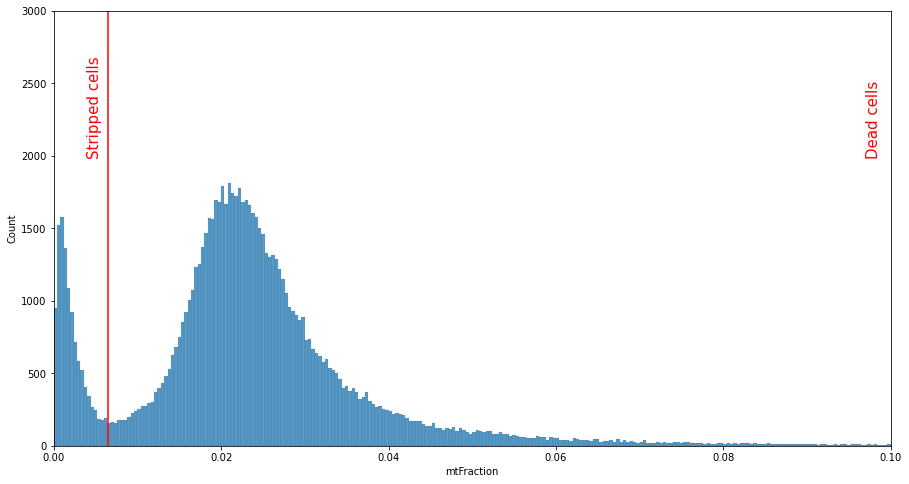

In [13]:
fig,ax = plt.subplots(1,1,figsize=[15,8])

#metFraction
i0 = 3; i1 = 0;
sns.histplot(data=adata.obs,x="mtFraction",ax=ax,binwidth=0.0004);
ax.axis([0,0.10,0,3000])
ax.vlines(MIN_MT_FRACTION,0,3000,color="r")
ax.text(0.004,2000,"Stripped cells",color="red",fontsize=15,rotation="vertical")
ax.vlines(MAX_MT_FRACTION,0,3000,color="r")
ax.text(0.097,2000,"Dead cells",color="red",fontsize=15,rotation="vertical")

fig.savefig("Plots/1_QC_mt_fraction.png",bbox_inches="tight",transparent=True)
fig.show()

## Scatter plot

From the scatter plot it looks like there is a bimodality. This may happen because a certain set of cells have a different gene expression diversity as other cells.. 

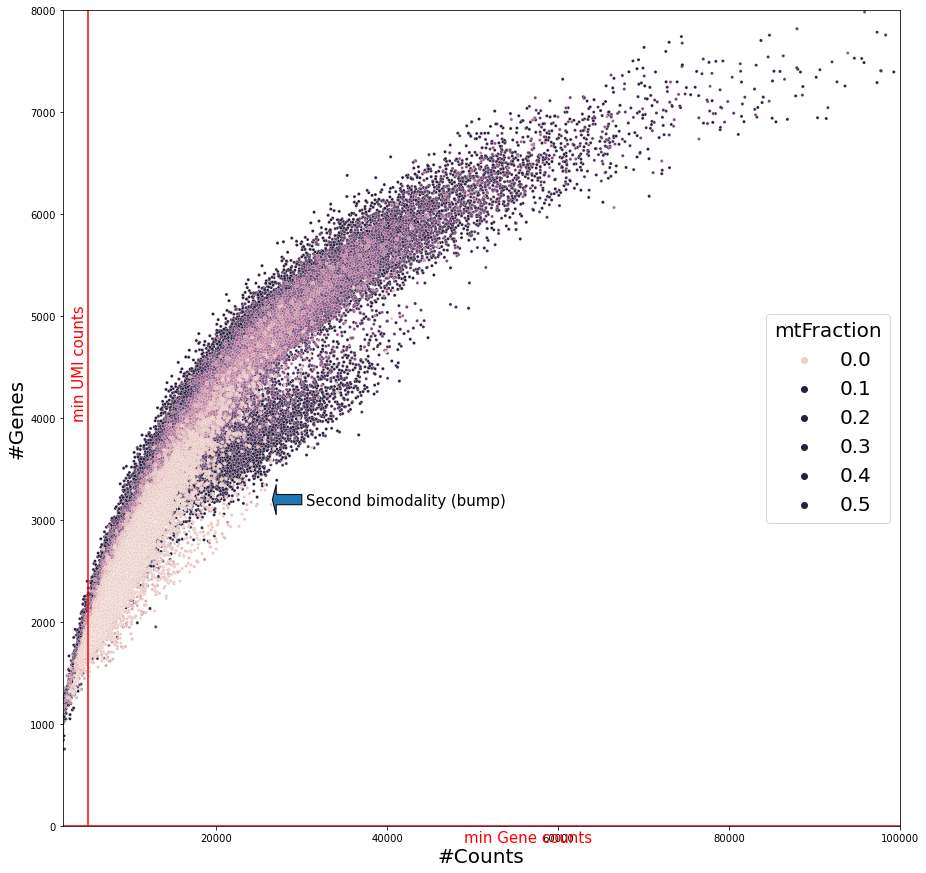

In [14]:
fig,ax = plt.subplots(1,1,figsize=[15,15])

i0 = 0
data = adata.obs.copy()
data.sort_values("mtFraction",inplace=True,ascending=False)
sns.scatterplot(x="#Counts",y="#Genes",hue="mtFraction",data=data,hue_norm=(0,0.02),ax=ax,s=10)
axis = [2000,100000,0,8000]
ax.legend(frameon=True,loc="center right",fontsize=20,title="mtFraction",title_fontsize=20)
ax.axis(axis)
ax.vlines(MAX_COUNTS,axis[2],axis[3])
#ax.text(maxCounts,5000,"min UMI count",rotation="vertical")
ax.vlines(MIN_COUNTS,axis[2],axis[3],color="r")
ax.text(MIN_COUNTS-(axis[1]-axis[0])*0.02,(axis[3]-axis[2])/2,"min UMI counts",color="r",rotation="vertical",fontsize=15)
#ax.hlines(MAX_GENES,axis[0],axis[1],color="r")
#ax.text((axis[1]-axis[0])/2,MAX_GENES+(axis[3]-axis[2])*0.01,"max Gene counts",color="r",rotation="horizontal",fontsize=15)
ax.hlines(MIN_GENES,axis[0],axis[1],color="r")
ax.text((axis[1]-axis[0])/2,MIN_GENES-(axis[3]-axis[2])*0.02,"min Gene counts",color="r",rotation="horizontal",fontsize=15)
ax.set_xlabel("#Counts",fontsize=20)
ax.set_ylabel("#Genes",fontsize=20)
ax.arrow(30000,3200,-3000,0,width=100)
ax.text(30500,3150,"Second bimodality (bump)",fontsize=15)

fig.savefig("Plots/1_QC_UMI_Genes_scatter.png",bbox_inches="tight",transparent=True)
fig.show()

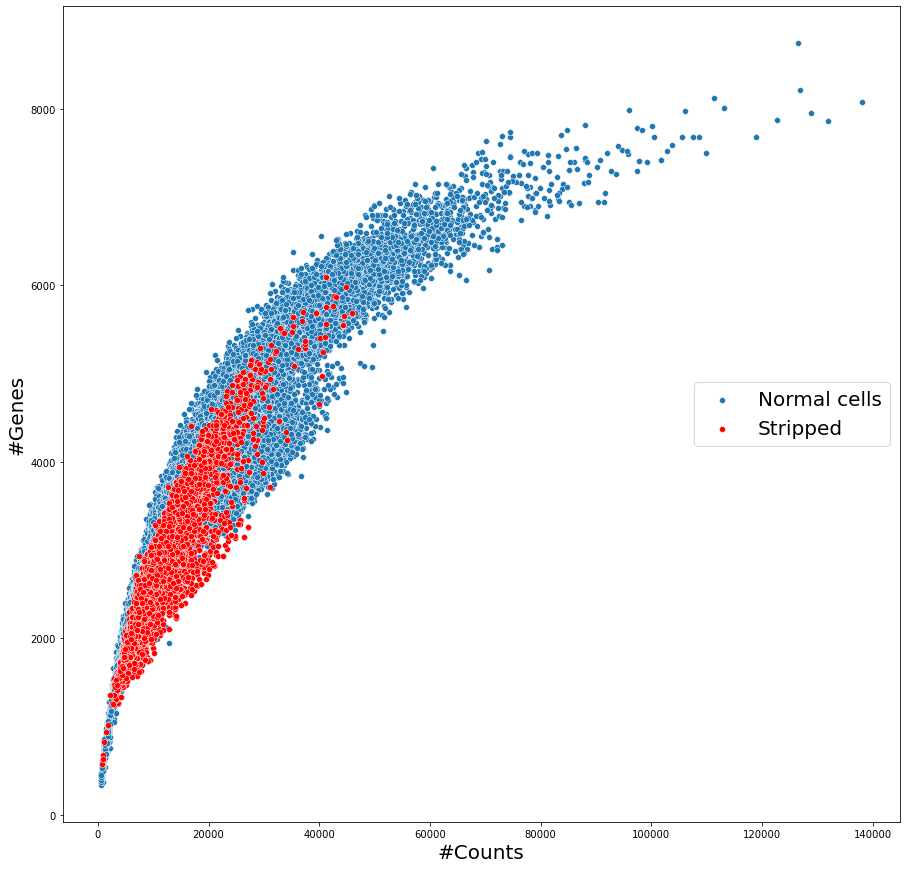

In [15]:
fig,ax = plt.subplots(1,1,figsize=[15,15])

i0 = 1
sns.scatterplot(x="#Counts",y="#Genes",data=adata.obs,ax=ax)
sns.scatterplot(x="#Counts",y="#Genes",color="r",data=adata.obs[adata.obs["mtFraction"]<MIN_MT_FRACTION],ax=ax)
ax.legend(["Normal cells","Stripped"],frameon=True,loc="center right",fontsize=20)
ax.set_xlabel("#Counts",fontsize=20)
ax.set_ylabel("#Genes",fontsize=20)

fig.savefig("Plots/1_QC_UMI_Genes_stripped.png",bbox_inches="tight",transparent=True)
fig.show()

### Scatter plot bimodality 

As in Pijuan, we look at the gene Hbb-bh1, which is an indicator of blod cell lines. As it can be seen, the second bump in the scatter plot comes from cells expressing the blod cell line indicator and start appearing from the later stages of the development. 

Blod cells show a lower diversity of genes, which is represented in the plots by the second modality at a lower gene expression. This confirms that we are not runing into technical artifacts with the datadata.

IndexError: index 5 is out of bounds for axis 0 with size 5

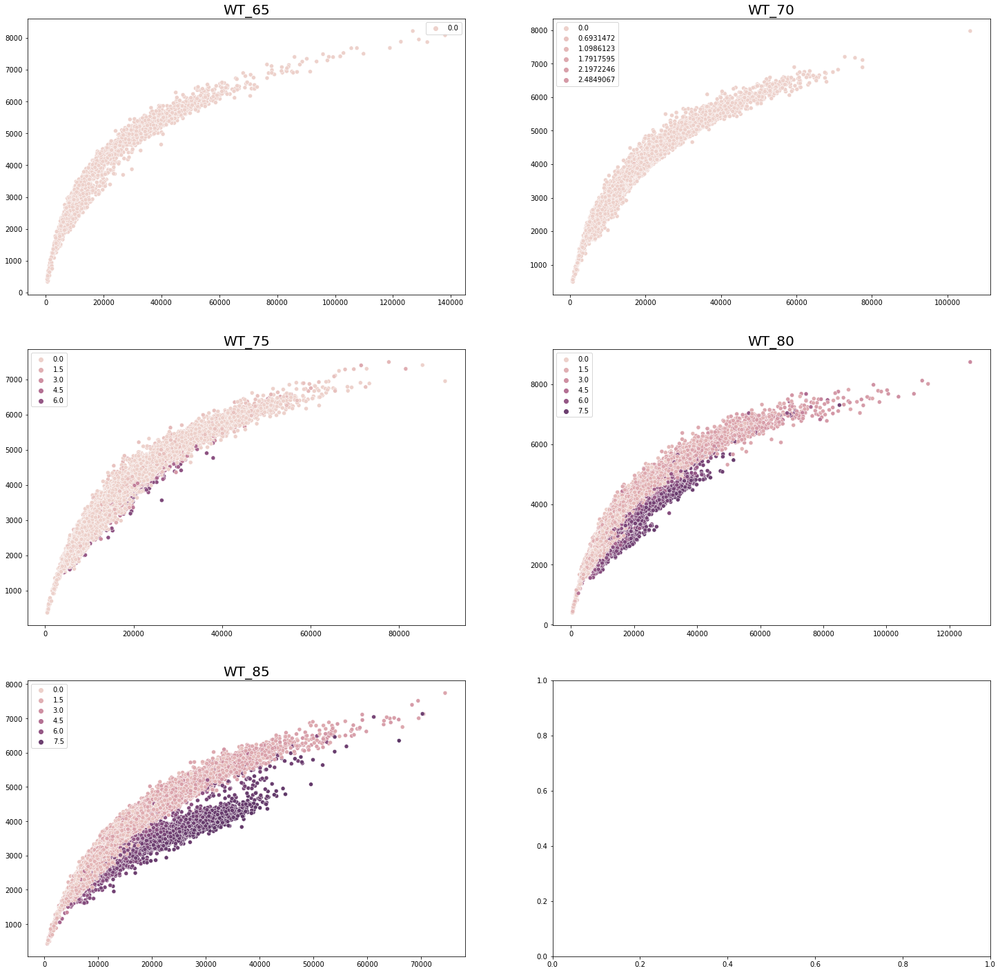

In [20]:
samp = np.sort(adata.obs["Stage"].unique())

fig,ax=plt.subplots(3,2,figsize=[25,25])
m = np.meshgrid(range(3),range(3))
hue = np.log(np.array(adata[:,adata.var["Gene"]=="Hbb-bh1"].X.todense()).reshape(-1)+1)
for i,j in zip(m[0].reshape(9),m[1].reshape(9)):
    k = 2*i+j
    l = adata.obs["Stage"]==samp[k]
    sns.scatterplot(x="#Counts",y="#Genes",hue=hue[l],hue_norm=(0,10),data=adata.obs[l],ax=ax[i,j])
    ax[i,j].set_xlabel("")
    ax[i,j].set_ylabel("")
    ax[i,j].set_title(str(samp[k]),fontsize=20)#,loc='lower right')
    
fig.text(0.5, 0.08, '#Genes', ha='center', fontsize=40)
fig.text(0.08, 0.5, '#Counts', va='center', rotation='vertical', fontsize=40)

fig.savefig("Plots/1_QC_Second_bimodality.png",bbox_inches="tight",transparent=True)
fig.show()

## Plots by samples

We do a quality check over the different samples of the dataset.

From their preprocessing, they already eliminated one sample (11) because showed an anomalous number of cells. But we keep it for sake of consistency with the preprocessing performed in the original paper.

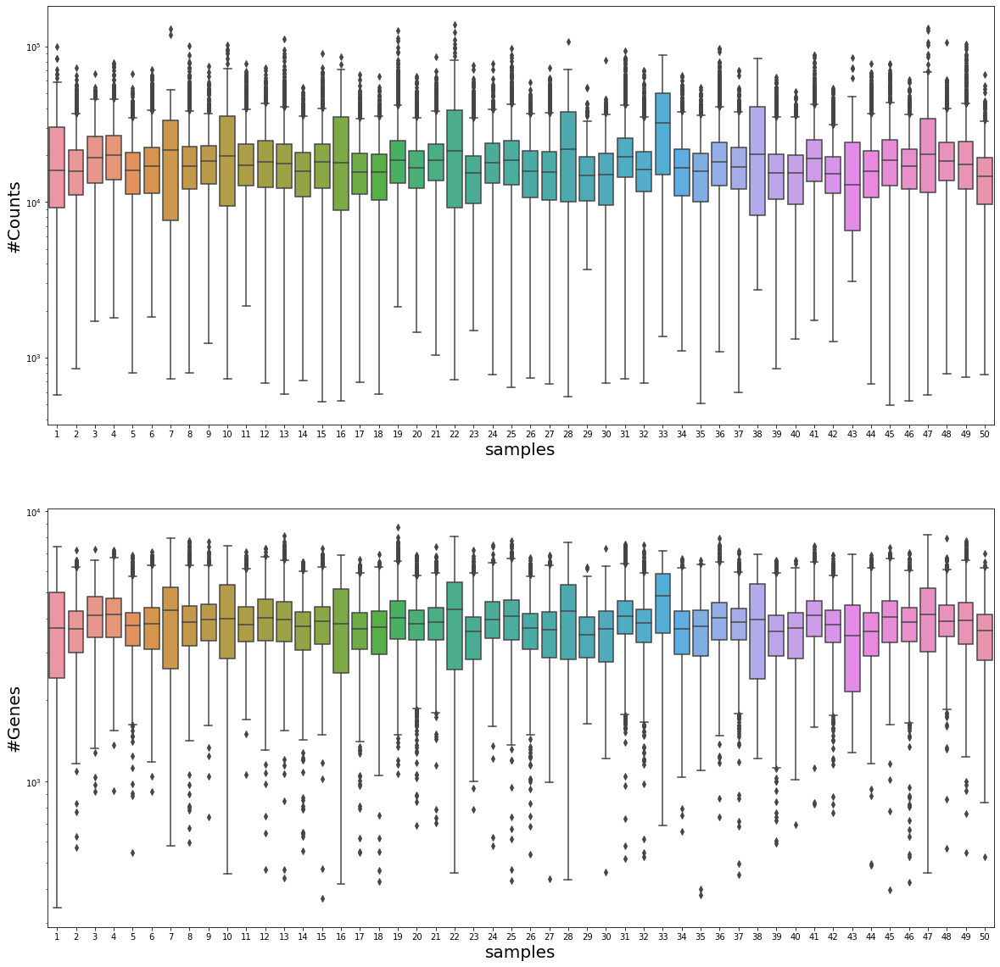

In [21]:
fig,ax = plt.subplots(2,1,figsize=[20,20])

sns.boxplot(y="#Counts",x="Sample",data=adata.obs,ax=ax[0])
ax[0].set_yscale("log")
ax[0].set_xlabel("samples",fontsize=20)
ax[0].set_ylabel("#Counts",fontsize=20)

sns.boxplot(y="#Genes",x="Sample",data=adata.obs,ax=ax[1])
ax[1].set_yscale("log")
ax[1].set_xlabel("samples",fontsize=20)
ax[1].set_ylabel("#Genes",fontsize=20)

fig.savefig("Plots/1_QC_UMI_Genes_sample.png",bbox_inches="tight",transparent=True)
fig.show()

## Plots by stages

When plotting against the stages, there does not seem to be bias on the expression and count levels.

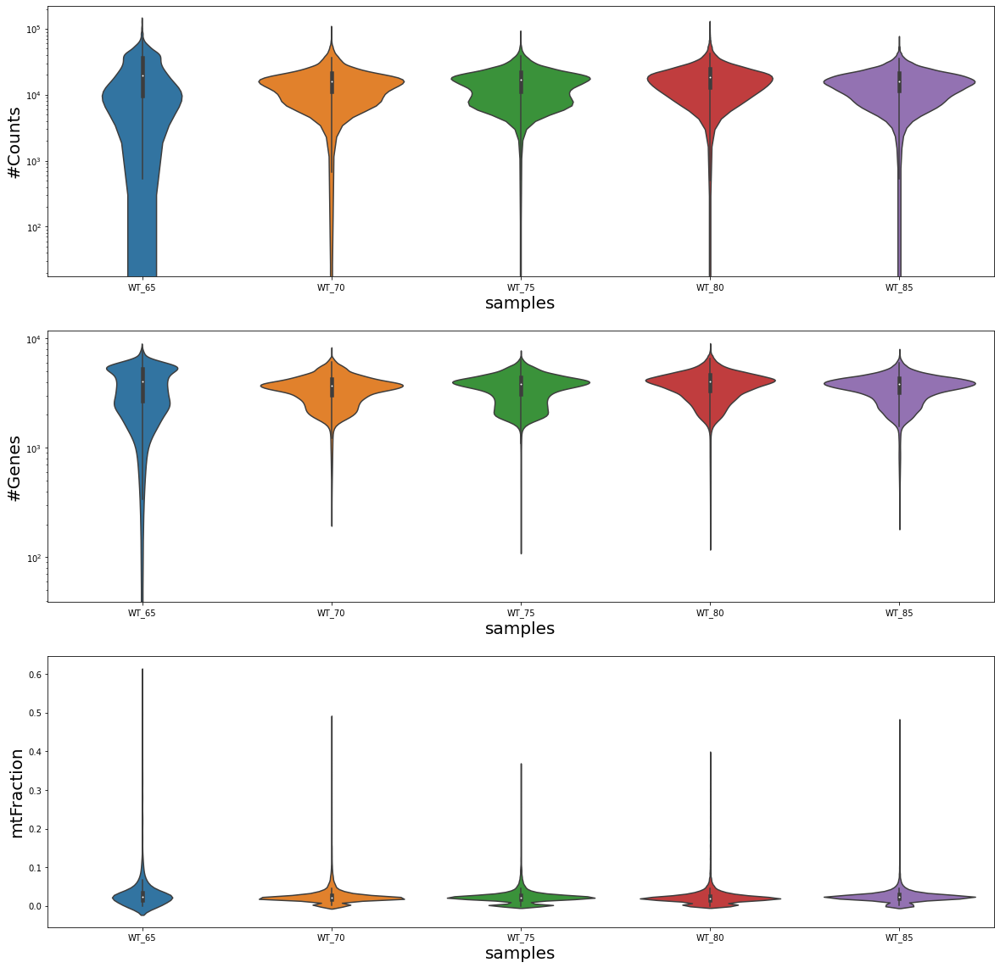

In [22]:
fig,ax = plt.subplots(3,1,figsize=[20,20])

sns.violinplot(y="#Counts",x="Stage",data=adata.obs,ax=ax[0])
ax[0].set_yscale("log")
ax[0].set_xlabel("samples",fontsize=20)
ax[0].set_ylabel("#Counts",fontsize=20)

sns.violinplot(y="#Genes",x="Stage",data=adata.obs,ax=ax[1])
ax[1].set_yscale("log")
ax[1].set_xlabel("samples",fontsize=20)
ax[1].set_ylabel("#Genes",fontsize=20)

sns.violinplot(y="mtFraction",x="Stage",data=adata.obs,ax=ax[2])
ax[2].set_xlabel("samples",fontsize=20)
ax[2].set_ylabel("mtFraction",fontsize=20)

fig.savefig("Plots/1_QC_UMI_Genes_stage.png",bbox_inches="tight",transparent=True)
fig.show()

# Doublets

Before this control, we account for doublet cells by running:

    1. Scrublet algorithm
    
This process gives scores to each cell with the probability of it to be a doublet. Deciding on a threshold to remove those doublets is critical as removing not enough cells could lead to artificial clusters in the data that are not biologically relevant.

We proceed with two strategies:

 1. Permissive approach: We set a common threashold for all samples based in the heuristic measure of doublet scores from doublets. This is very similar to the approach followed in the original paper.
 2. Conservative approach: We will remove all cells that are are a standard deviation over the mean doublet score for that sample.

## Compute doublet scores

### Scrublet

Scrublet algorithm for the detectiuon of doublets. We perform this algorithm with the following characteristics:

- Each sample is analized independently as doublets are produced within each mouse sample with their own batch effects and disgregation problems.
- The doublet score is computed generating doublets and considering the neighbors in a reduced space constructed as:
    - Highly Variable Genes (HVGs) as selected automatically by "seurat" algorithm in `scanpy.pp.highly_varying_genes`.
    - Removed HVGs related with cell cycle and sex.
    - Retained 50 Principal Components (PCs) `scanpy.pp.pca`.
    - KNN matrix generated with the 50 PCs and "correlation" metric as implemented in `scanpy.pp.neighbors`.

In [23]:
scrublet_pipeline(adata,
                batch_key="Sample",
                normalize=True,
                target_sum=adata.obs["#Counts"].mean(),
                log_normalize=True,
                feature_reduction_flavor=HVG_METHOD,
                n_retained_features=N_FEATURES,
                exclude_genes=SKIP_GENES,
                key_exclude_list="Gene",
                n_prin_components = N_PCS,
                knn_dist_metric=METRIC,
                key_added="Scrublet_score",
                doublet_statistics_file="Results/Scrublet_doublet_scores",
                verbose=False)

Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.
Trying to set attrib

We choose the doublet score to impute as cells base on a unique threshold for all doublet bimodality diagrams. Up to this point of the analysis we do not remove any cells from the dataset.

#### Selection of a doublet score over the permissive threshold.

Simulated doublet scores show a bimodality in the doublet scores that can be used for the selection of a doublet threshold. Based on the plot, we set a more less permissive threshold for the hole dataset.

In [24]:
adata.obs.loc[:,"Doublet_permissive"] = adata.obs.loc[:,"Scrublet_score"] > DOUBLET_SCORE_MAX_THRESHOLD

Text(0.5, 0, 'Sample')

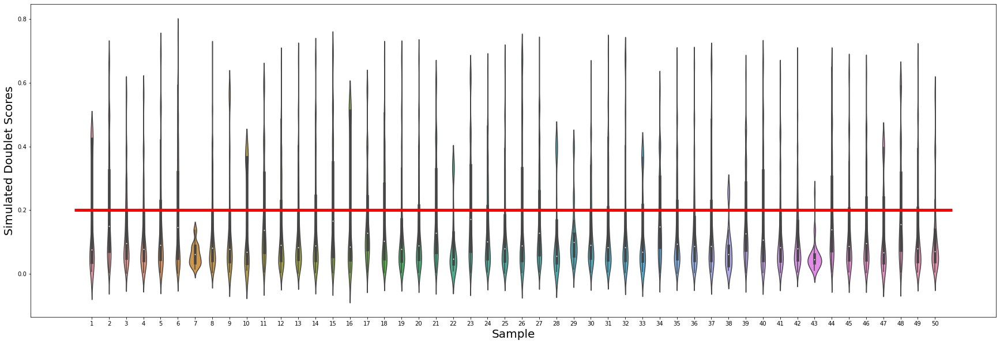

In [28]:
data = pd.read_csv("Results/Scrublet_doublet_scores")

fig, ax = plt.subplots(1,1,figsize=[30,10])
sns.violinplot(data=data,x="Sample",y="doublet_score_sim")
ax.hlines(DOUBLET_SCORE_MAX_THRESHOLD,-1,50,linewidth=5,zorder=10,color="red")
ax.set_ylabel("Simulated Doublet Scores",fontsize=20)
ax.set_xlabel("Sample",fontsize=20)

#### Selection of the conservative threshold

The scores of the real data points shows long tailed distributions of scores. For setting a threshold a more strict threshold. We set the threshold for each dataset by imputing all measures that are one sigma above the mean doublet score for that sample.

It is worth notice that the automatic selection of the threshold is in general quite conserved between samples. This preservation is expected as the different samples for the same stage should contain similar conditions of the data. The only stage showing high variability is stage E6.75. This can be originated by the wrong staging of the data or from problems with some of the samples included.

In [26]:
m = adata.obs.groupby("Sample").mean()
m["std"] = m["Scrublet_score"] + adata.obs.groupby("Sample").std()["Scrublet_score"]

adata.obs["Doublet_conservative"] = False
for sample in adata.obs["Sample"].unique():
    adata.obs.loc[adata.obs["Sample"] == sample,"Doublet_conservative"] = adata.obs.loc[adata.obs["Sample"] == sample,"Scrublet_score"] > m.loc[sample,"std"]

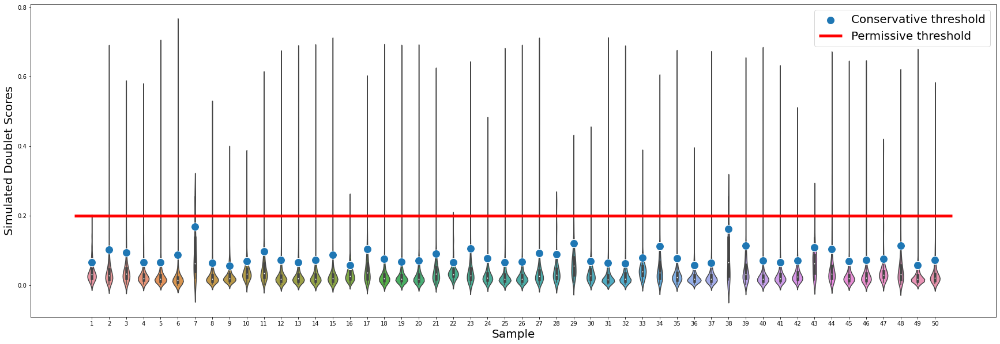

In [29]:
fig, ax = plt.subplots(1,1,figsize=[30,10])
sns.violinplot(data=adata.obs,x="Sample",y="Scrublet_score",ax=ax,label="Scrublet scores")
c = -1-np.cumsum(np.diff(m.index.values)-1)
sns.scatterplot(x=m.index.values+np.append([-1],c),y=m["std"].values,s=200,label="Conservative threshold",zorder=10)
ax.hlines(DOUBLET_SCORE_MAX_THRESHOLD,-1,50,linewidth=5,zorder=10,color="red",label="Permissive threshold")
ax.set_ylabel("Simulated Doublet Scores",fontsize=20)
ax.set_xlabel("Sample",fontsize=20)
ax.legend(fontsize=20)

plt.show()

In [45]:
m = adata.obs.groupby("Stage").mean()
m["std"] = m["Scrublet_score"] + adata.obs.groupby("Stage").std()["Scrublet_score"]
stage = ["E"+str(i) for i in m["Stage_numeric"]]

m2 = adata.obs.groupby("Sample").mean()
m2["std"] = m2["Scrublet_score"] + adata.obs.groupby("Sample").std()["Scrublet_score"]
stage2 = ["E"+str(i) for i in m2["Stage_numeric"]]

fig, ax = plt.subplots(1,1,figsize=[30,10])
sns.violinplot(data=adata.obs,x="Stage",y="Scrublet_score")
sns.scatterplot(x=stage2,y=m2["std"].values,s=500,label="Conservative threshold")
sns.scatterplot(x=stage,y=m["std"].values,s=1000,label="Mean conservative threshold")
ax.hlines(DOUBLET_SCORE_MAX_THRESHOLD,-1,m.shape[0],linewidth=5,zorder=1,color="red",label="Permissive threshold")
ax.set_ylabel("Simulated Doublet Scores",fontsize=20)
ax.set_xlabel("Stage",fontsize=20)
ax.legend(fontsize=20)

plt.show()

KeyError: 'Stage_numeric'

# Dimensionality reduction

In this stage, we make a dimensionality reduction of the RNA space that encodes the information in a relevant space. **This analysis is performed for each temporal Stage of development independently as different times during development may be captured more effectively with different effective spaces.**

For obtaining each reduced space we follow the following pipeline:

1. Normalize the total count to the mean number of counts among all cells of the dataset.
2. Log normalize the counts. 
3. Select Highly Varying Genes using Seurat algorithm as implemented by `scanpy.pp.highly_varying_genes`. We remove from the highly varying genes those genes related to growth and sex.
4. Perform PCA analysis over the HVGs divemnsions and retain the 50 most variable PCs as our reduced space. We use the implementation of `scanpy.pp.pca`.

For visualization of the data, we further perform the following steps:

5. KNN matrix generated with the 50 PCs and "correlation" metric as implemented in `scanpy.pp.neighbors`.
6. UMAP in 2D representations as implemented in `scanpy.tl.umap`.

Visualization of the reduced space by stages shows batch effects distortions that should be corrected. Use of kBET metric further confirms the existence of distortion in almost all the stages but in mixed_gastrulation (considering rejection rates at 75%).

In [46]:
# Normalize to the mean total
scp.pp.normalize_total(adata,target_sum=adata.obs.loc[:,"#Counts"].mean())
# Lognormalize
scp.pp.log1p(adata)

In [47]:
dimensionality_reduction_pipeline(adata,
                                 feature_reduction_flavor=HVG_METHOD,
                                 n_retained_features=N_FEATURES,
                                 n_comps=N_PCS,
                                 exclude_genes=SKIP_GENES,
                                 key_exclude_list="Gene"
                                 )

### UMAP

In [48]:
neighbors_batches(adata,use_rep="X_pca_Stage",metric=METRIC)

2022-07-07 18:10:50.824466: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /.singularity.d/libs
2022-07-07 18:10:50.824494: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


In [49]:
umap_batches(adata,neighbors_key="Neighbors_Stage")

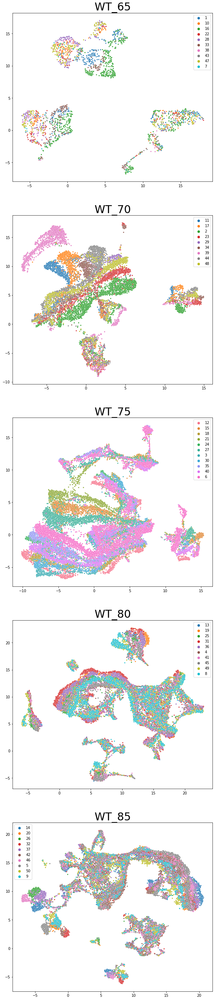

In [50]:
fig,ax= plt.subplots(len(adata.obs["Stage"].unique()),figsize=[10,10*len(adata.obs["Stage"].unique())])

for i,stage in enumerate(np.sort(adata.obs["Stage_numeric"].unique())):
    
    l = adata.obs.loc[:,"Stage_numeric"]==stage
    
    order = np.argsort(adata.obs.loc[l,"Sample"].values.astype(str))
    hue = np.sort(adata.obs.loc[l,"Sample"].values.astype(str))
    sns.scatterplot(adata.obsm["X_umap_Stage"][l,0][order],adata.obsm["X_umap_Stage"][l,1][order],hue=hue,s=10,ax=ax[i])
    ax[i].set_title(adata.obs.loc[l,"Stage"][0],fontsize=30)

### kBET

In [51]:
kbet = pd.DataFrame()
for stage in adata.obs["Stage"].unique():
    mes,p = kBET(adata.obsm["X_pca_Stage"][adata.obs["Stage"]==stage,:],adata.obs.loc[adata.obs["Stage"]==stage,"Sample"].values,metric="correlation")
    kbet.loc[stage,"Uncorrected"] = mes
    
kbet

,Uncorrected
WT_65,0.204825
WT_70,0.053185
WT_75,0.041974
WT_80,0.206306
WT_85,0.168110


# Batch correction

We correct the batch effects with the follwing algorithms:

1. Harmony provided in `scanpy.external.pp.harmony_integrate`.
2. fastMNN provided in `mnnpy.mnn_correct`.

The PCS corrected through Harmony and fastMNN show a proper correction of the batch effects between samples for all stages except for E7.75 and E6.5 (kBET rejection rate 75% and visual inspection).

Except for E6.5 where the kBET score is better than Harmony, the overall results are very similar or slightly better for the Harmony correction. Visually, the Harmony correction looks overall more uniform too. We keep hence this correction for the rest of the analysis.

## fastMNN

In [52]:
mnn_integrate_batches(adata)

In [53]:
neighbors_batches(adata,add_key="Neighbors_MNN_Stage",use_rep="X_pca_MNN_Stage",metric=METRIC)

In [54]:
umap_batches(adata,neighbors_key="Neighbors_MNN_Stage",add_key="X_umap_MNN_Stage")

## Harmony

In [55]:
harmony_integrate_batches(adata,verbose=False)

In [56]:
neighbors_batches(adata,add_key="Neighbors_Harmony_Stage",use_rep="X_pca_Harmony_Stage",metric=METRIC)

In [57]:
umap_batches(adata,neighbors_key="Neighbors_Harmony_Stage",add_key="X_umap_Harmony_Stage")

## UMAP

Text(0.5, 1.0, 'MNN')

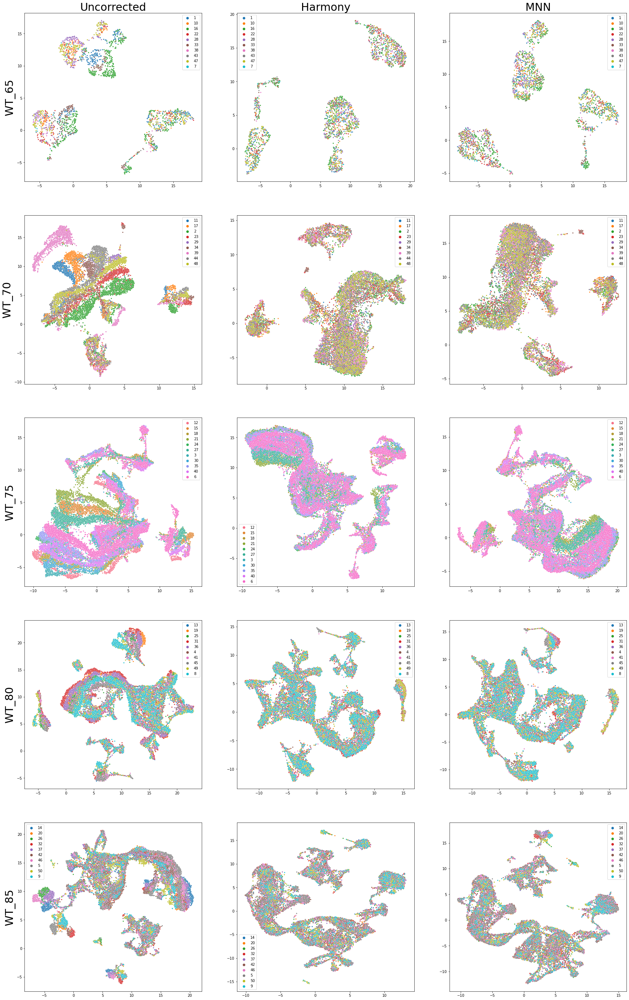

In [58]:
fig,ax= plt.subplots(len(adata.obs["Stage"].unique()),3,figsize=[30,10*len(adata.obs["Stage"].unique())])

for i,stage in enumerate(np.sort(adata.obs["Stage_numeric"].unique())):
    
    l = adata.obs.loc[:,"Stage_numeric"]==stage
    
    order = np.argsort(adata.obs.loc[l,"Sample"].values.astype(str))
    hue = np.sort(adata.obs.loc[l,"Sample"].values.astype(str))
    sns.scatterplot(adata.obsm["X_umap_Stage"][l,0][order],adata.obsm["X_umap_Stage"][l,1][order],hue=hue,s=10,ax=ax[i,0])
    ax[i,0].set_ylabel(adata.obs.loc[l,"Stage"][0],fontsize=30)
    
    order = np.argsort(adata.obs.loc[l,"Sample"].values.astype(str))
    hue = np.sort(adata.obs.loc[l,"Sample"].values.astype(str))
    sns.scatterplot(adata.obsm["X_umap_Harmony_Stage"][l,0][order],adata.obsm["X_umap_Harmony_Stage"][l,1][order],hue=hue,s=10,ax=ax[i,1])
    
    order = np.argsort(adata.obs.loc[l,"Sample"].values.astype(str))
    hue = np.sort(adata.obs.loc[l,"Sample"].values.astype(str))
    sns.scatterplot(adata.obsm["X_umap_MNN_Stage"][l,0][order],adata.obsm["X_umap_MNN_Stage"][l,1][order],hue=hue,s=10,ax=ax[i,2])

ax[0,0].set_title("Uncorrected",fontsize=30)
ax[0,1].set_title("Harmony",fontsize=30)
ax[0,2].set_title("MNN",fontsize=30)

## kBET

In [59]:
for stage in adata.obs["Stage"].unique():
    mes,p = kBET(adata.obsm["X_pca_MNN_Stage"][adata.obs["Stage"]==stage,:],adata.obs.loc[adata.obs["Stage"]==stage,"Sample"].values,metric="correlation")
    kbet.loc[stage,"fastMNN"] = mes

    mes,p = kBET(adata.obsm["X_pca_Harmony_Stage"][adata.obs["Stage"]==stage,:],adata.obs.loc[adata.obs["Stage"]==stage,"Sample"].values,metric="correlation")
    kbet.loc[stage,"Harmony"] = mes

kbet

,Uncorrected,fastMNN,Harmony
WT_65,0.204825,0.671053,0.742544
WT_70,0.053185,0.628083,0.599259
WT_75,0.041974,0.329261,0.315404
WT_80,0.206306,0.791253,0.833148
WT_85,0.168110,0.815634,0.883189


# Location imputed cells

After correcting for batch effects, we visualize the location of stripped and doublets cells that where imputed during the Quality Control. Most of the imputed cells show grouped in clusters. This is consistent with our expectation of stripped and doublet cells to group as "cell types" of artificial nature. 

In [60]:
adata.obs["Stripped"] = adata.obs["mtFraction"] < MIN_MT_FRACTION

### UMAP

For comparison, we visualize the cells that we impute in our analysis and those from the original paper from Marioni finding a great discrepancy in the removal of cells. Putting a more restrictive threshold to our analysis recover a closer cleaning of the original analysis showing that our filtering is in general more permissive.

Text(0.5, 1.0, 'Restrictive imputation')

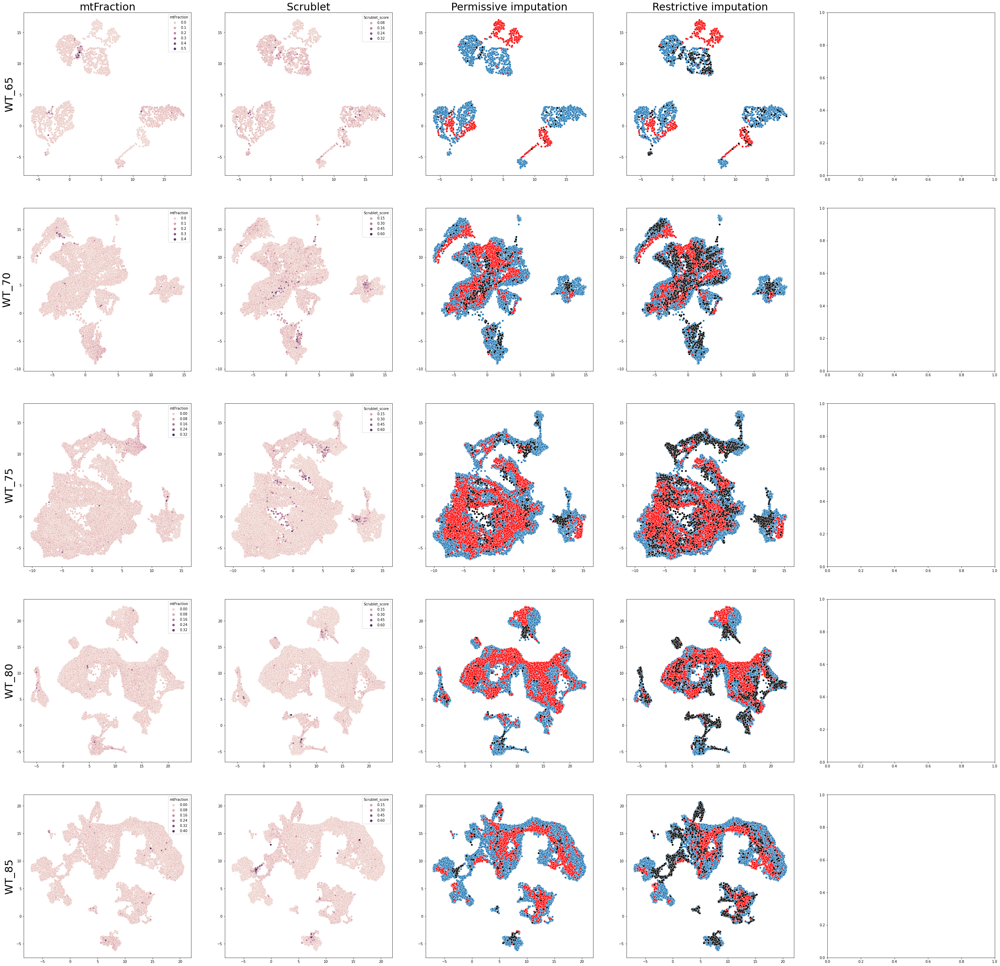

In [63]:
fig,ax= plt.subplots(len(adata.obs["Stage"].unique()),5,figsize=[50,10*len(adata.obs["Stage"].unique())])

#data = pd.read_csv("./data/raw/meta.tab",sep="\t",skiprows=0)

for i,stage in enumerate(np.sort(adata.obs["Stage_numeric"].unique())):
        
    
    l = adata.obs.loc[:,"Stage_numeric"]==stage    
    ax[i,0].set_ylabel(adata.obs.loc[l,"Stage"][0],fontsize=30)

    hue = adata.obs.loc[l,"mtFraction"]
    sns.scatterplot(adata.obsm["X_umap_Stage"][l,0],adata.obsm["X_umap_Stage"][l,1],hue=hue,s=30,ax=ax[i,0])

    hue = adata.obs.loc[l,"Scrublet_score"]
    sns.scatterplot(adata.obsm["X_umap_Stage"][l,0],adata.obsm["X_umap_Stage"][l,1],hue=hue,s=30,ax=ax[i,1])
    
    sns.scatterplot(adata.obsm["X_umap_Stage"][l,0],adata.obsm["X_umap_Stage"][l,1],s=30,ax=ax[i,2])
    stripped = adata.obs.loc[l,"mtFraction"] < MIN_MT_FRACTION
    sns.scatterplot(adata.obsm["X_umap_Stage"][l,0][stripped],adata.obsm["X_umap_Stage"][l,1][stripped],color="red",s=30,ax=ax[i,2])
    nodoublet = adata.obs.loc[l,"Doublet_permissive"]== True
    sns.scatterplot(adata.obsm["X_umap_Stage"][l,0][nodoublet],adata.obsm["X_umap_Stage"][l,1][nodoublet],color="black",s=30,ax=ax[i,2])

    sns.scatterplot(adata.obsm["X_umap_Stage"][l,0],adata.obsm["X_umap_Stage"][l,1],s=30,ax=ax[i,3])
    stripped = adata.obs.loc[l,"mtFraction"] < MIN_MT_FRACTION
    sns.scatterplot(adata.obsm["X_umap_Stage"][l,0][stripped],adata.obsm["X_umap_Stage"][l,1][stripped],color="red",s=30,ax=ax[i,3])
    nodoublet = adata.obs.loc[l,"Doublet_conservative"] == True
    sns.scatterplot(adata.obsm["X_umap_Stage"][l,0][nodoublet],adata.obsm["X_umap_Stage"][l,1][nodoublet],color="black",s=30,ax=ax[i,3])
    
   # sns.scatterplot(adata.obsm["X_umap_Stage"][l,0],adata.obsm["X_umap_Stage"][l,1],s=30,ax=ax[i,4])
   # stripped = data.loc[:,"stripped"].values[l]
   # sns.scatterplot(adata.obsm["X_umap_Stage"][l,0][stripped],adata.obsm["X_umap_Stage"][l,1][stripped],color="red",s=30,ax=ax[i,4])
   # nodoublet = data.loc[:,"doublet"].values[l]
   # sns.scatterplot(adata.obsm["X_umap_Stage"][l,0][nodoublet],adata.obsm["X_umap_Stage"][l,1][nodoublet],color="black",s=30,ax=ax[i,4])

ax[0,0].set_title("mtFraction",fontsize=30)
ax[0,1].set_title("Scrublet",fontsize=30)
ax[0,2].set_title("Permissive imputation",fontsize=30)
ax[0,3].set_title("Restrictive imputation",fontsize=30)
#ax[0,4].set_title("Pijuan-Sala",fontsize=30)

### Concentration of imputted cells in clusters

Before removing the imputed cells. We make a clustering of the data. With the lowest resolution that we are going to employ for our purposes. In this way, we can see if there are artificial clusters generated from stripped and doublet fates.

For that we:

 1. Cluster the data with Louvain clustering at a low resolution.
 2. Plot the proportion of imputed cells per cluster.
 
We check that there are clusters with a clear stripped or doublet transcriptome. We remove all cells from those clusters, even if they were not imputed directly. The reasoning that there may be some cells that where not imputed at first may come from the fact that the algorithms are stochastics and dependent on the dataset measures, which can leave some cells behind without imputation but that effectively share the same transcriptomical fate as the imputed ones, making them very likely to be of the same nature.

In [64]:
louvain_batches(adata,
                   neighbors_key = "Neighbors_Harmony_Stage",
                   resolution = 2)

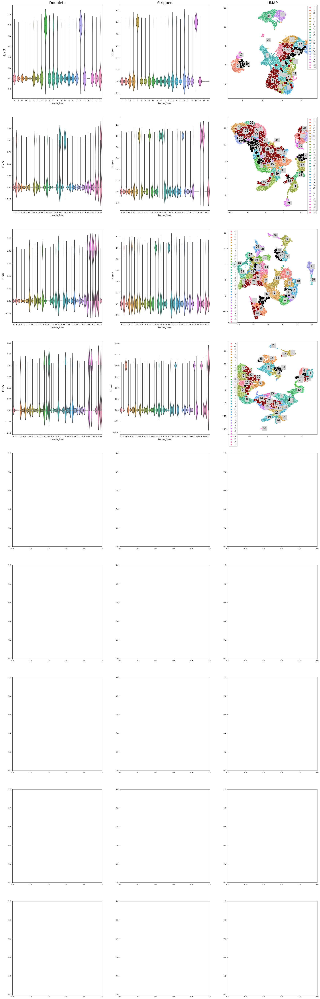

In [65]:
fig,ax = plt.subplots(9,3,figsize=[30,100])

n_std = 1
limit = MAX_CLUSTER_IMPUTED_PROPORTION

for i,stage in enumerate(np.sort(adata.obs["Stage_numeric"].unique())[1:]):
    
    l = adata.obs["Stage_numeric"] == stage
    d = adata.obs.loc[l,["Stage","Louvain_Stage","Scrublet_score","Doublet_conservative","mtFraction"]] 
        
    sns.violinplot(data=d,x="Louvain_Stage",y="Doublet_conservative",scale="width",ax=ax[i,0])
    
    removed = np.zeros(adata.shape[0])
    
    d["Doublet_conservative"] = d["Doublet_conservative"].astype(int)
    v = d.groupby("Louvain_Stage").mean()
    sns.scatterplot(adata.obsm["X_umap_Harmony_Stage"][l,0],adata.obsm["X_umap_Harmony_Stage"][l,1],adata.obs.loc[l,"Louvain_Stage"],ax=ax[i,2])
    m = v[v["Doublet_conservative"]>limit].index.values    
    for cluster in m:
        l2 = adata.obs["Louvain_Stage"] == cluster
        removed += l2
        l2 *= l
        sns.scatterplot(adata.obsm["X_umap_Harmony_Stage"][l2,0],adata.obsm["X_umap_Harmony_Stage"][l2,1],color="black",s=200,ax=ax[i,2])

    adata.obs.loc[:,"Doublet_by_cluster"] = removed
        
    removed = np.zeros(adata.shape[0])
        
    d["Stripped"] = (d["mtFraction"] < MIN_MT_FRACTION).astype(int)
    v = d.groupby("Louvain_Stage").mean()
    m = v[v["Stripped"]>limit].index.values    
    for cluster in m:
        l2 = adata.obs["Louvain_Stage"] == cluster
        removed += l2
        l2 *= l
        sns.scatterplot(adata.obsm["X_umap_Harmony_Stage"][l2,0],adata.obsm["X_umap_Harmony_Stage"][l2,1],color="darkred",s=200,ax=ax[i,2])
        
    adata.obs.loc[:,"Stripped_by_cluster"] = removed
        
    sns.violinplot(data=d,x="Louvain_Stage",y="Stripped",scale="width",ax=ax[i,1])
        
    l = adata.obs.loc[:,"Stage_numeric"]==stage    
    t = adata.obs.loc[l,"Louvain_Stage"].astype(str)
    for k in t.unique():
        if k != "nan":
            pos = adata.obsm["X_umap_Harmony_Stage"][l,:][t==k,:]
            pos = np.nan_to_num(pos)
            pos = pos.mean(axis=0)
            ax[i,2].text(pos[0],pos[1],k,fontsize=15,backgroundcolor="lightgrey")
        
        
    ax[i,0].set_ylabel("E"+str(stage),fontsize=20)
    

ax[0,0].set_title("Doublets",fontsize=20)
ax[0,1].set_title("Stripped",fontsize=20)
ax[0,2].set_title("UMAP",fontsize=20)

fig.savefig("Doblets.png")

plt.show()

### Compare cells imputed by Pijuan-Sala and our analysis

Comparison can't be done yet.


## Remove imputed cells and recompute dimensionality reduction procedure

Having inspected the reasoable outcome of the imputed cells, we proceed to remove those and recompute the reduced space of the cleaned dataset from steps 1-6 described above and save the data.

In [71]:
# Save first full dataset
import os
os.environ["HDF5_USE_FILE_LOCKING"] = "FALSE"
adata.write("data/raw.h5ad");

OSError: Unable to create file (unable to open file: name = 'data/raw.h5ad', errno = 2, error message = 'No such file or directory', flags = 13, o_flags = 242)

In [72]:
# Eliminate imputed cells
adata = adata[adata.obs.loc[:,"mtFraction"] > MIN_MT_FRACTION].copy()
adata = adata[adata.obs["Doublet_conservative"] == False]
adata.obs.reset_index(inplace=True)

In [73]:
dimensionality_reduction_pipeline(adata,
                                 feature_reduction_flavor=HVG_METHOD,
                                 n_retained_features=N_FEATURES,
                                 n_comps=N_PCS,
                                 exclude_genes=SKIP_GENES,
                                 key_exclude_list="Gene"
                                 )

In [74]:
harmony_integrate_batches(adata,verbose=False)

In [75]:
neighbors_batches(adata,add_key="Neighbors_Harmony_Stage",use_rep="X_pca_Harmony_Stage",metric=METRIC)

In [76]:
umap_batches(adata,neighbors_key="Neighbors_Harmony_Stage",add_key="X_umap_Harmony_Stage")

### UMAP

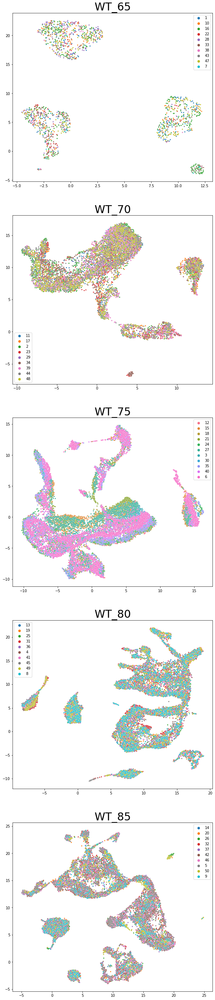

In [79]:
fig,ax= plt.subplots(len(adata.obs["Stage"].unique()),figsize=[10,10*len(adata.obs["Stage"].unique())])

for i,stage in enumerate(np.sort(adata.obs["Stage_numeric"].unique())):
    
    l = adata.obs.loc[:,"Stage_numeric"]==stage
    
    order = np.argsort(adata.obs.loc[l,"Sample"].values.astype(str))
    hue = np.sort(adata.obs.loc[l,"Sample"].values.astype(str))
    sns.scatterplot(adata.obsm["X_umap_Harmony_Stage"][l,0][order],adata.obsm["X_umap_Harmony_Stage"][l,1][order],hue=hue,s=10,ax=ax[i])
    ax[i].set_title(adata.obs.loc[l,"Stage"][0],fontsize=30)

### kBET

In [78]:
for stage in adata.obs["Stage"].unique():
    mes,p = kBET(adata.obsm["X_pca_Harmony_Stage"][adata.obs["Stage"]==stage,:],adata.obs.loc[adata.obs["Stage"]==stage,"Sample"].values,metric="correlation")
    kbet.loc[stage,"Harmony_after_imputation"] = mes
    
kbet

,Uncorrected,fastMNN,Harmony,Harmony_after_imputation
WT_65,0.204825,0.671053,0.742544,0.684177
WT_70,0.053185,0.628083,0.599259,0.589077
WT_75,0.041974,0.329261,0.315404,0.231825
WT_80,0.206306,0.791253,0.833148,0.812443
WT_85,0.168110,0.815634,0.883189,0.878512


# Save data

In [80]:
adata.write("qc_v2.h5ad");